<a href="https://colab.research.google.com/github/JADESOLA-O/Car-Prediction-Using-Machine-Learning/blob/main/ML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# latest version of sklearn (to have access to recent features)
!pip install --upgrade scikit-learn==1.4.0 -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 37.3 MB/s eta 0:00:00


In [ ]:
!pip install phik
!pip install ppscore
!pip install shap
!pip install -q category_encoders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 4.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 42.2 MB/s eta 0:00:00
  Created wheel for ppscore: filename=ppscore-1.3.0-py2.py3-none-any.whl size=13165 sha256=be85f1482d73deb1cce6809af062785fe8d4fad77ef88df40f23ed5c3621a433
  Stored in directory: /root/.cache/pip/wheels/42/87/10/00056aa2d2624f1b9374db6a0d5245da9a3d87bdc9247c1a56
Successfully built ppscore
  Attempting uninstall: pandas
    Found existing installation: pandas 2.0.3
    Uninstalling pandas-2.0.3:
      Successfully uninstalled pandas-2.0.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.0.3, but you have pandas 1.5.3 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 2.5 MB/s eta 0:00:00
     

In [ ]:
# Import necessary libraries
import shap
import phik
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
sns.set(
    { "figure.figsize": (6, 4) }, style='ticks', color_codes=True, font_scale=0.8
)
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, cross_validate
from sklearn.impute import SimpleImputer
from functools import partial
from sklearn.decomposition import PCA
from category_encoders import TargetEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.inspection import PartialDependenceDisplay
from sklearn.feature_selection import SelectKBest, f_regression, RFECV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, OneHotEncoder
from sklearn.model_selection import cross_val_score, GridSearchCV, ParameterGrid, RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor, HistGradientBoostingRegressor, VotingRegressor, GradientBoostingRegressor
from sklearn.metrics import explained_variance_score,mean_absolute_error,r2_score, mean_squared_error



%matplotlib inline
rmse = partial(mean_squared_error, squared=False)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings(action="ignore", message="^internal gelsd")

%config InlineBackend.figure_format = 'retina'


shap.initjs()


In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

In [ ]:
import pandas as pd

# Use read_excel instead of read_csv for Excel files
at = pd.read_excel('/content/Sales_dataset_file.xlsx')
at.head()

In [ ]:
# Uploading the Car Advert data file from your local computer
import pandas as pd
at = pd.read_csv('/content/adverts (4).csv')
at.head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol
3,202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel
4,202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel


In [ ]:
# to view the last five row and columns in the dataframe
at.tail()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
402000,202010315652942,5179.0,69,Grey,Peugeot,208,USED,2019.0,10595,Hatchback,False,Petrol
402001,202010315657341,110000.0,59,Red,Peugeot,107,USED,2009.0,2000,Hatchback,False,Petrol
402002,202010315659271,52760.0,62,White,Nissan,Qashqai,USED,2012.0,7250,SUV,False,Petrol
402003,202011015662436,10250.0,65,Red,Abarth,595,USED,2015.0,11490,Hatchback,False,Petrol
402004,201512149444029,14000.0,14,Silver,Audi,A4 Avant,USED,2014.0,20520,Estate,False,Diesel


In [ ]:
at.shape  # obtain the total number of rows and columns in the dataset

(402005, 12)

In [ ]:
# check for the data index
at.index

RangeIndex(start=0, stop=402005, step=1)

In [ ]:
at.info() #to check for a brief info about the dataset(data type =pandas, missing values and datatype

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402005 entries, 0 to 402004
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       402005 non-null  int64  
 1   mileage                401878 non-null  float64
 2   reg_code               370148 non-null  object 
 3   standard_colour        396627 non-null  object 
 4   standard_make          402005 non-null  object 
 5   standard_model         402005 non-null  object 
 6   vehicle_condition      402005 non-null  object 
 7   year_of_registration   368694 non-null  float64
 8   price                  402005 non-null  int64  
 9   body_type              401168 non-null  object 
 10  crossover_car_and_van  402005 non-null  bool   
 11  fuel_type              401404 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(7)
memory usage: 34.1+ MB


In [ ]:
at.dtypes

public_reference           int64
mileage                  float64
reg_code                  object
standard_colour           object
standard_make             object
standard_model            object
vehicle_condition         object
year_of_registration     float64
price                      int64
body_type                 object
crossover_car_and_van       bool
fuel_type                 object
dtype: object

In [ ]:
at.describe() #to get the numeric values by using the .describe()

,public_reference,mileage,year_of_registration,price
count,4.020050e+05,401878.000000,368694.000000,4.020050e+05
mean,2.020071e+14,37743.595656,2015.006206,1.734197e+04
std,1.691662e+10,34831.724018,7.962667,4.643746e+04
min,2.013072e+14,0.000000,999.000000,1.200000e+02
25%,2.020090e+14,10481.000000,2013.000000,7.495000e+03
50%,2.020093e+14,28629.500000,2016.000000,1.260000e+04
75%,2.020102e+14,56875.750000,2018.000000,2.000000e+04
max,2.020110e+14,999999.000000,2020.000000,9.999999e+06


In [ ]:
#to get the non_numeric values by using the .describe()
at.describe(include='object')

,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,body_type,fuel_type
count,370148,396627,402005,402005,402005,401168,401404
unique,72,22,110,1168,2,16,9
top,17,Black,BMW,Golf,USED,Hatchback,Petrol
freq,36738,86287,37376,11583,370756,167315,216929


In [ ]:
# To view the entire dataset's descriptive statistics
at.describe(include = 'all')

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
count,4.020050e+05,401878.000000,370148,396627,402005,402005,402005,368694.000000,4.020050e+05,401168,402005,401404
unique,NaN,NaN,72,22,110,1168,2,NaN,NaN,16,2,9
top,NaN,NaN,17,Black,BMW,Golf,USED,NaN,NaN,Hatchback,False,Petrol
freq,NaN,NaN,36738,86287,37376,11583,370756,NaN,NaN,167315,400210,216929
mean,2.020071e+14,37743.595656,NaN,NaN,NaN,NaN,NaN,2015.006206,1.734197e+04,NaN,NaN,NaN
std,1.691662e+10,34831.724018,NaN,NaN,NaN,NaN,NaN,7.962667,4.643746e+04,NaN,NaN,NaN
min,2.013072e+14,0.000000,NaN,NaN,NaN,NaN,NaN,999.000000,1.200000e+02,NaN,NaN,NaN
25%,2.020090e+14,10481.000000,NaN,NaN,NaN,NaN,NaN,2013.000000,7.495000e+03,NaN,NaN,NaN
50%,2.020093e+14,28629.500000,NaN,NaN,NaN,NaN,NaN,2016.000000,1.260000e+04,NaN,NaN,NaN
75%,2.020102e+14,56875.750000,NaN,NaN,NaN,NaN,NaN,2018.000000,2.000000e+04,NaN,NaN,NaN


In [ ]:
at.columns #view all column title in the dataframe

Index(['public_reference', 'mileage', 'reg_code', 'standard_colour',
       'standard_make', 'standard_model', 'vehicle_condition',
       'year_of_registration', 'price', 'body_type', 'crossover_car_and_van',
       'fuel_type'],
      dtype='object')

In [ ]:
at = at.set_index('public_reference') #set public reference as index column

In [ ]:
cat_feat_lst = at.select_dtypes(include = ['object']).columns  # Creating list of all categorical features
cat_feat_lst.tolist()

['reg_code',
 'standard_colour',
 'standard_make',
 'standard_model',
 'vehicle_condition',
 'body_type',
 'fuel_type']

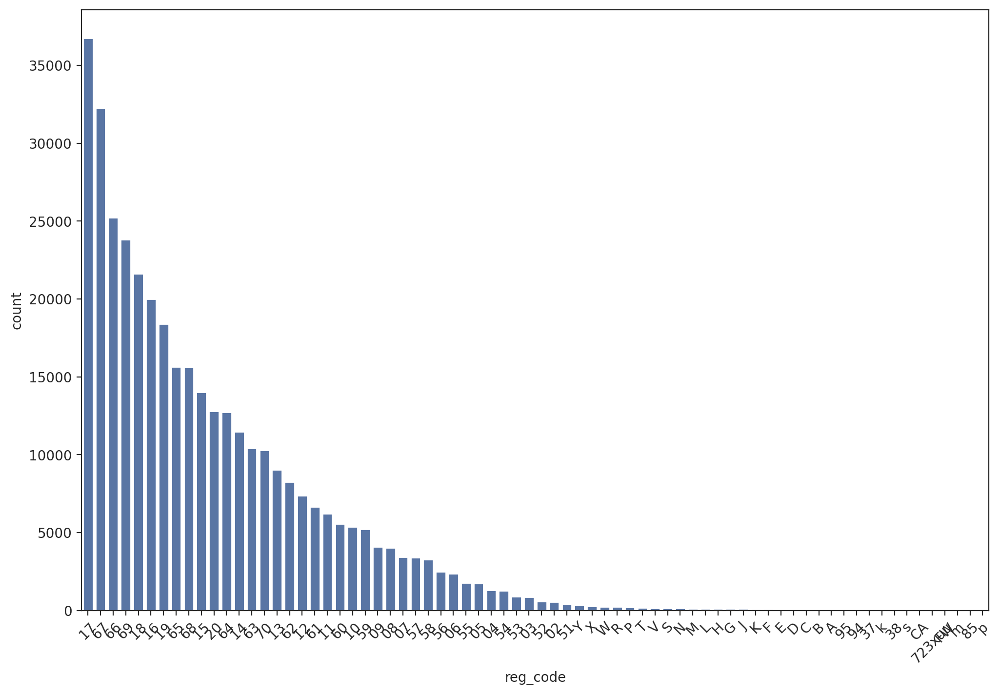

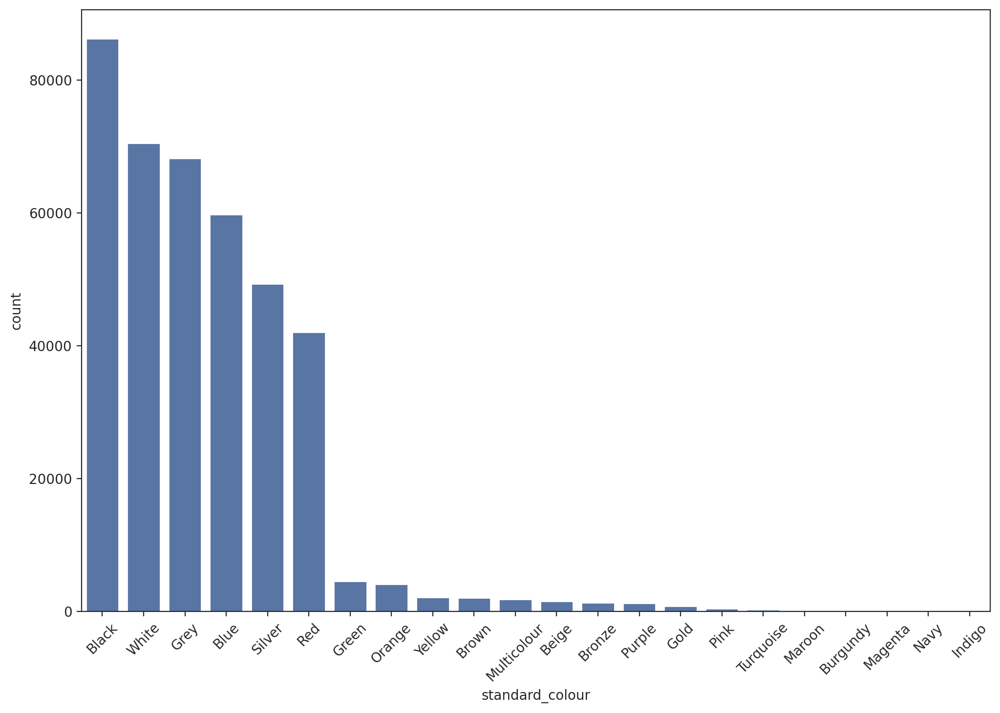

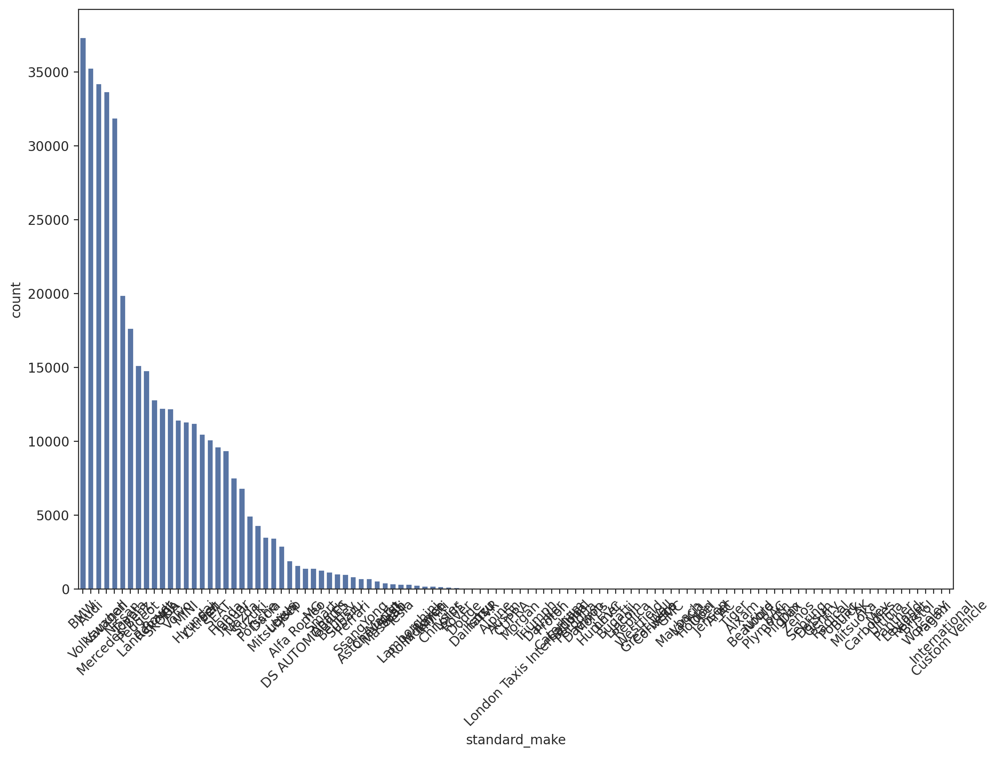

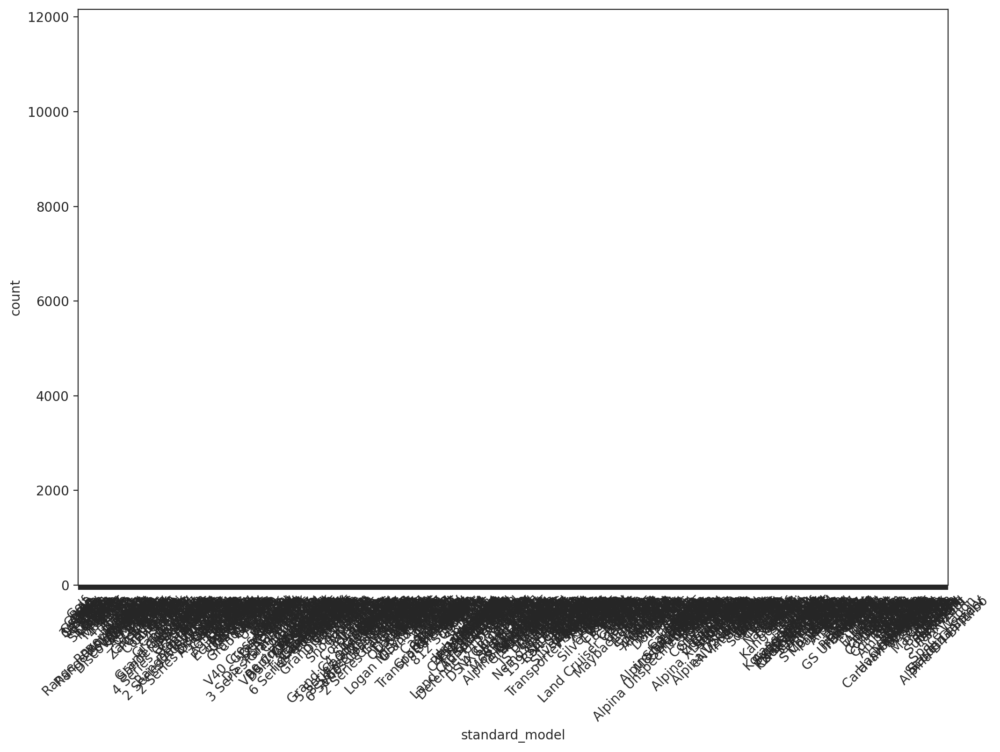

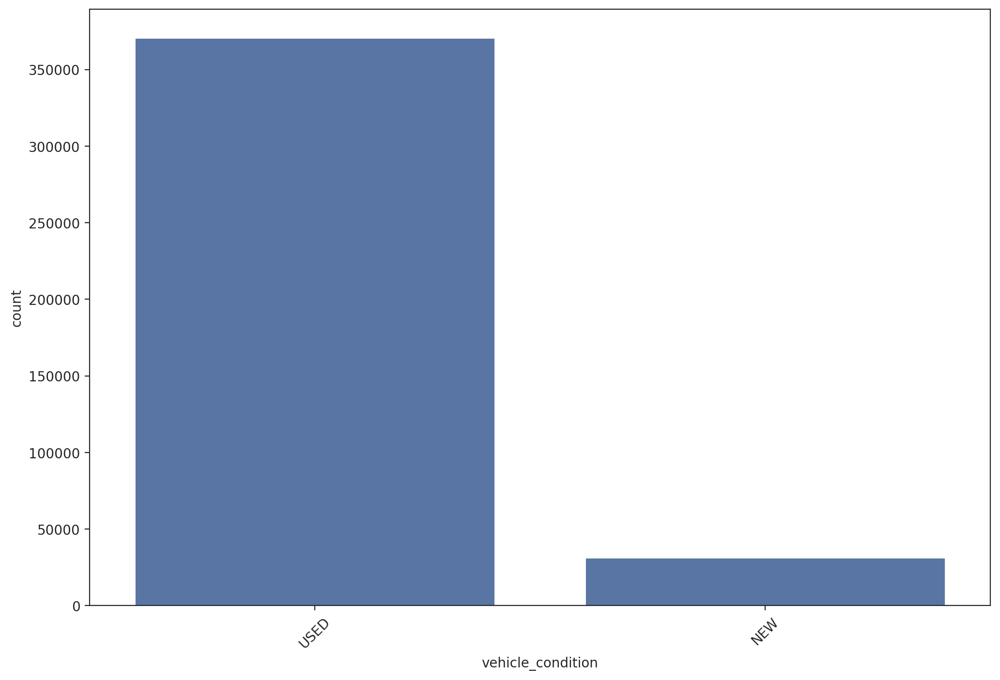

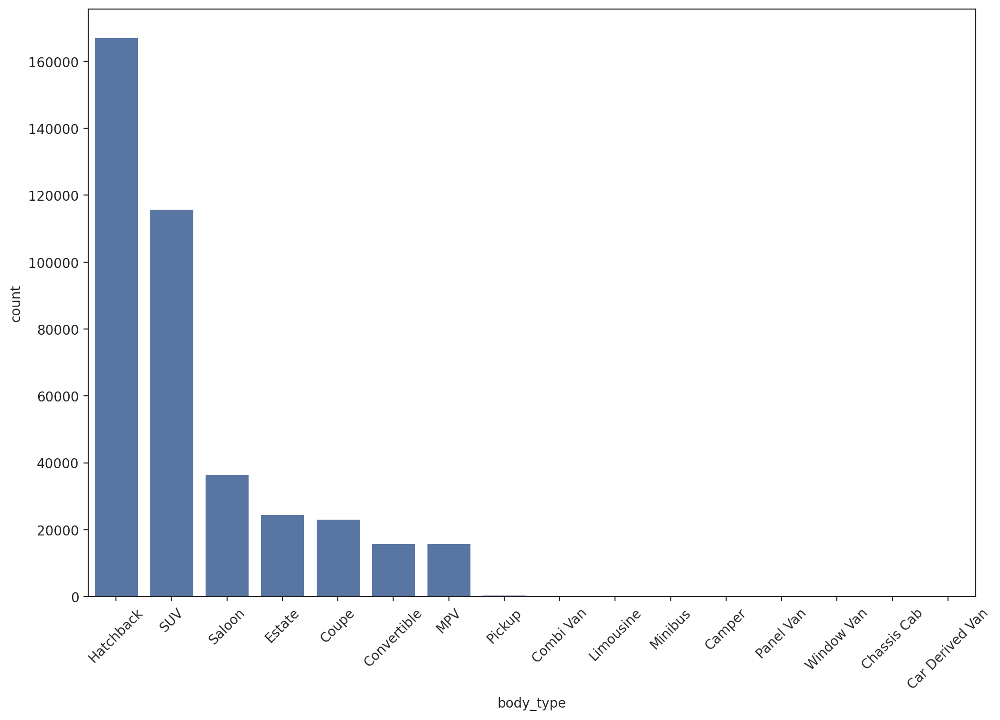

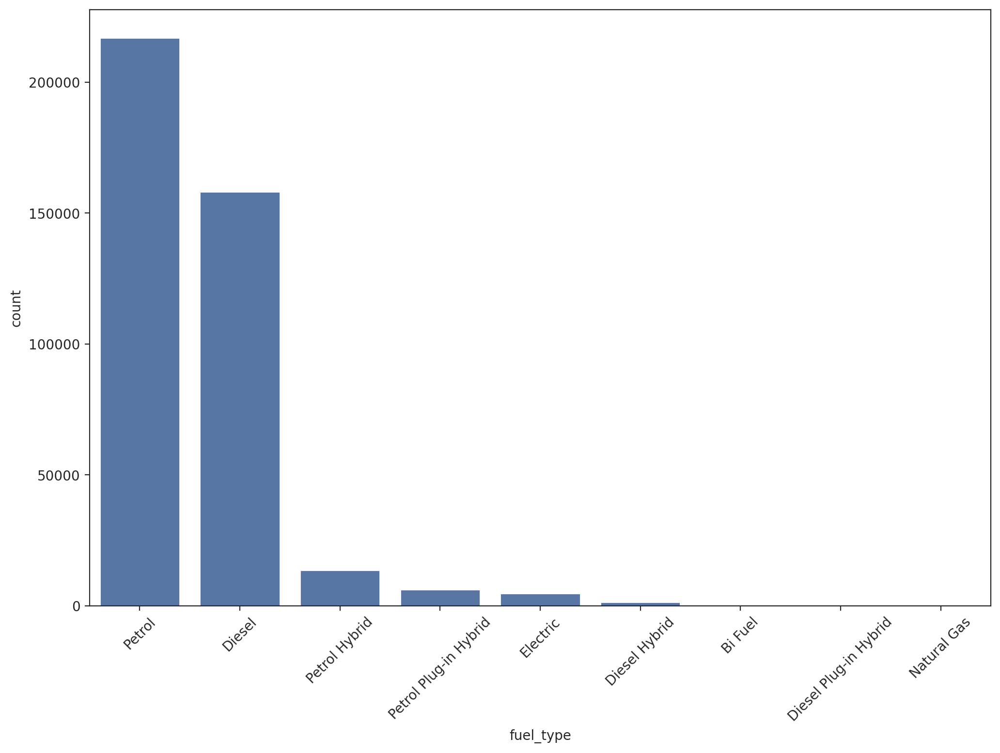

In [ ]:
# Display individual count plots for categorical features
for feature in cat_feat_lst:
    plt.figure(figsize=(12, 8))
    sns.countplot(x=at[feature], order=at[feature].value_counts().index)
    plt.xticks(rotation=45)
    plt.show()

<ipython-input-23-73645d0aece3>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  g = sns.catplot(x=feature, kind="count", palette="ch:.25", height=4, aspect=2, data=at)


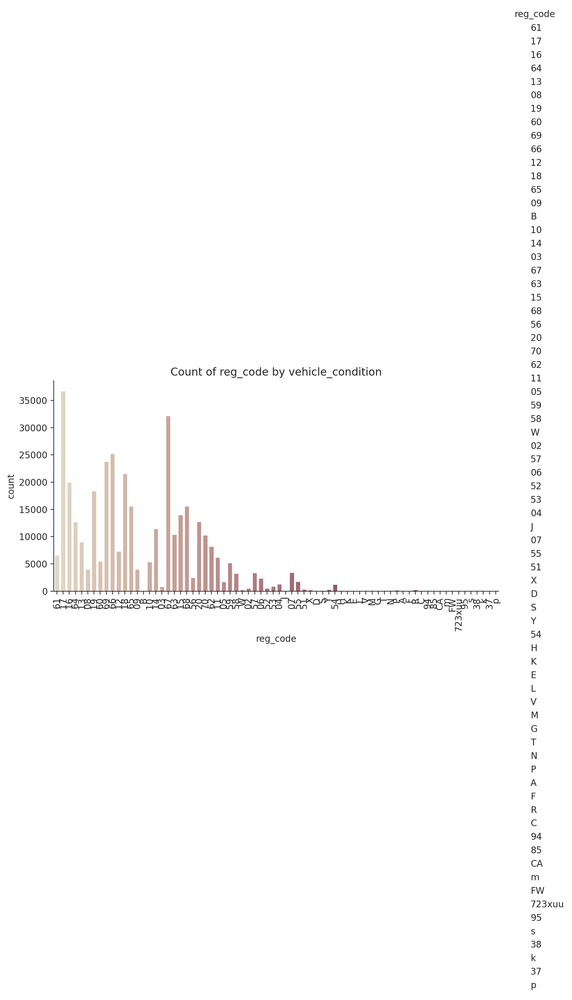

<ipython-input-23-73645d0aece3>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  g = sns.catplot(x=feature, kind="count", palette="ch:.25", height=4, aspect=2, data=at)


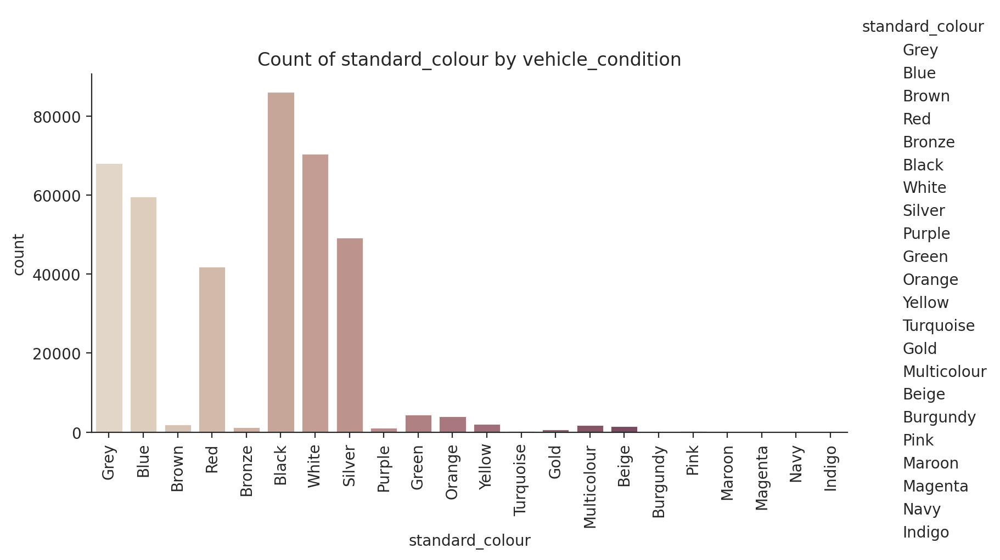

<ipython-input-23-73645d0aece3>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  g = sns.catplot(x=feature, kind="count", palette="ch:.25", height=4, aspect=2, data=at)


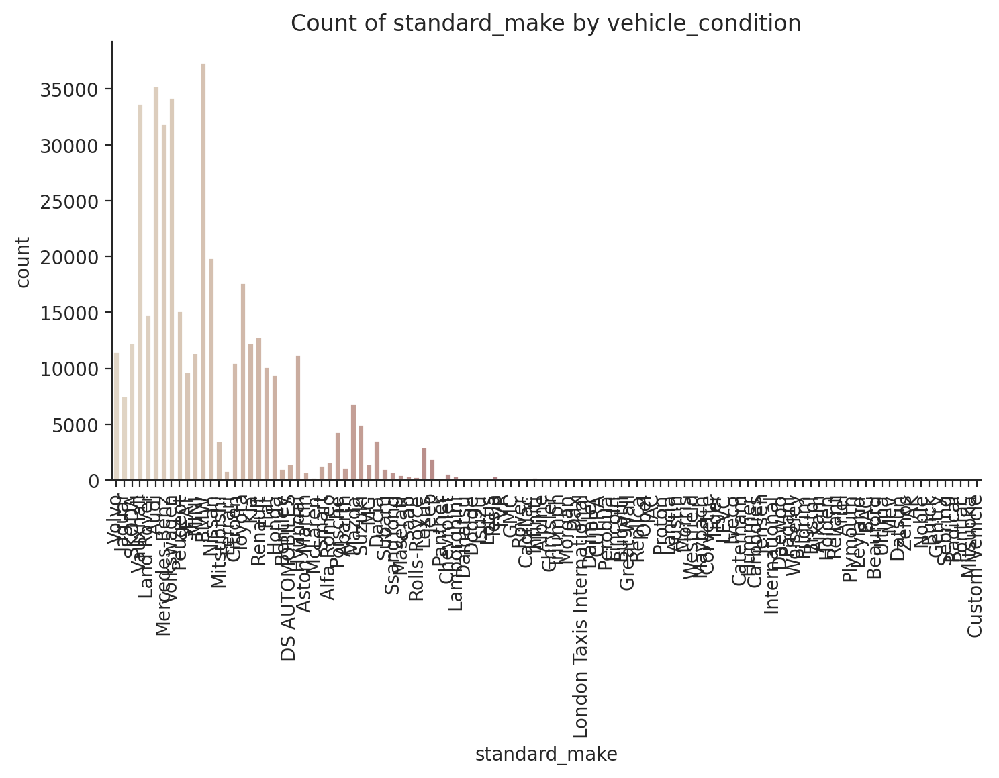

<ipython-input-23-73645d0aece3>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  g = sns.catplot(x=feature, kind="count", palette="ch:.25", height=4, aspect=2, data=at)


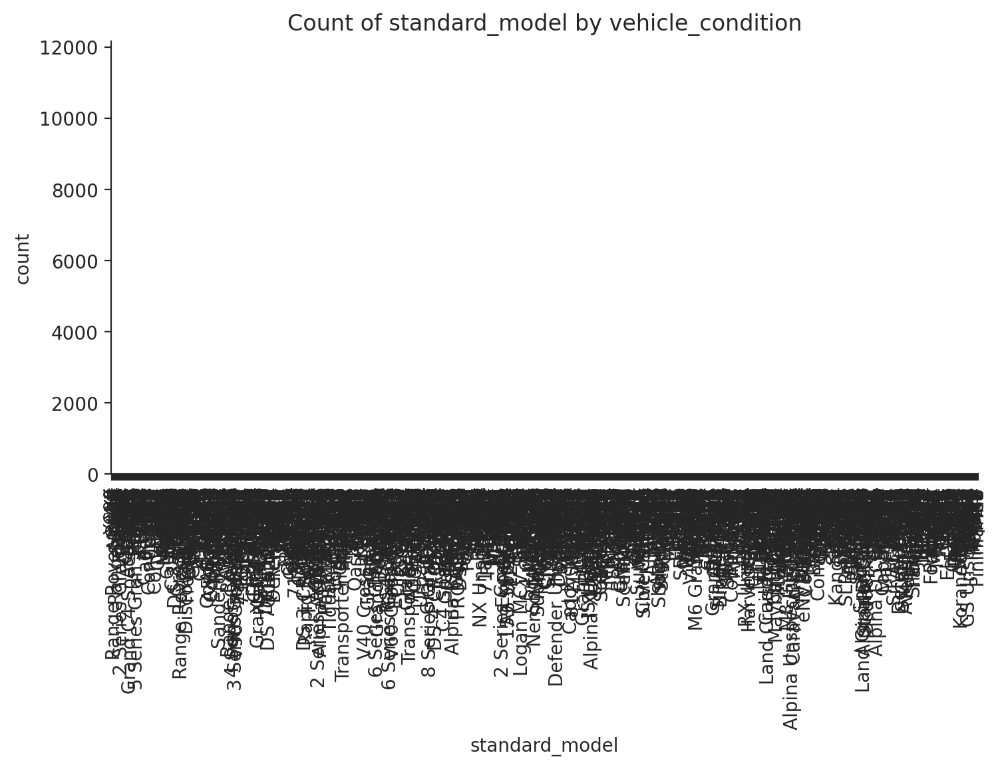

<ipython-input-23-73645d0aece3>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  g = sns.catplot(x=feature, kind="count", palette="ch:.25", height=4, aspect=2, data=at)


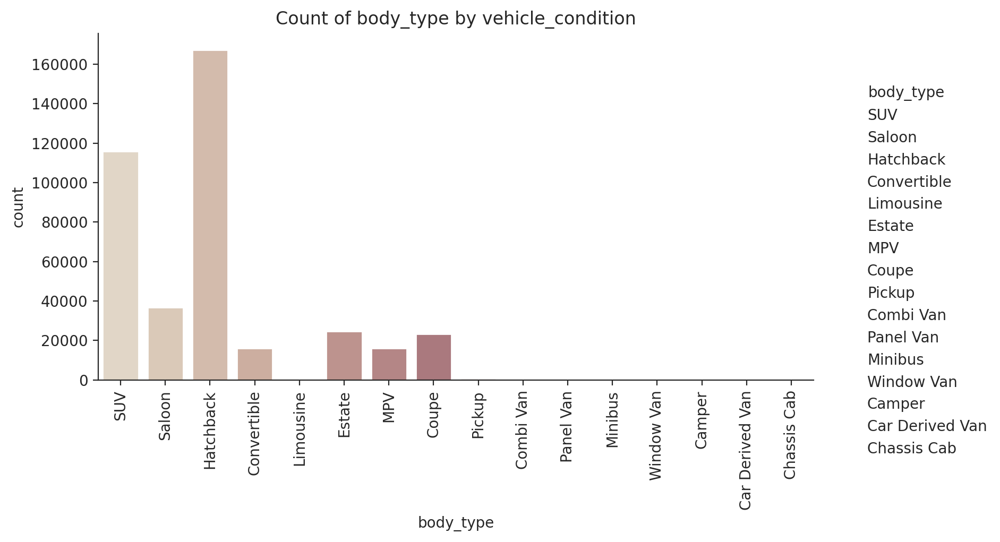

<ipython-input-23-73645d0aece3>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  g = sns.catplot(x=feature, kind="count", palette="ch:.25", height=4, aspect=2, data=at)


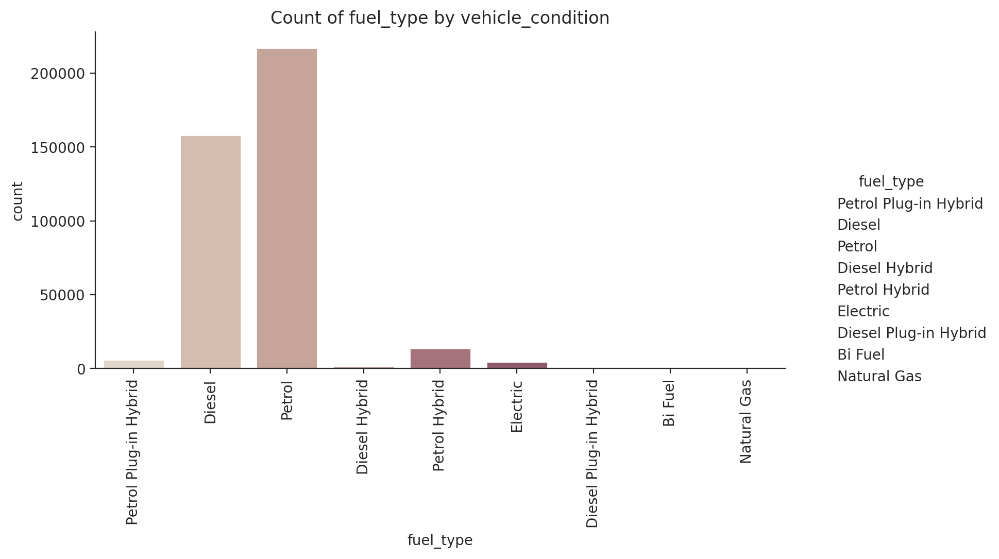

In [ ]:
# Select a primary feature for comparison (e.g., 'vehicle_condition')
primary_feature = 'vehicle_condition'

# Create plots for each categorical feature against the primary feature
for feature in cat_feat_lst:
    if feature != primary_feature:  # Skip the primary feature itself
        g = sns.catplot(x=feature, kind="count", palette="ch:.25", height=4, aspect=2, data=at)
        g.set_xticklabels(rotation=90)  # Rotate x labels for better readability
        g.set_titles(f'{feature} by {primary_feature}')
        plt.title(f'Count of {feature} by {primary_feature}')
        plt.show()


[Text(0.5, 1.0, 'Distribution of Mileage without Outliers')]

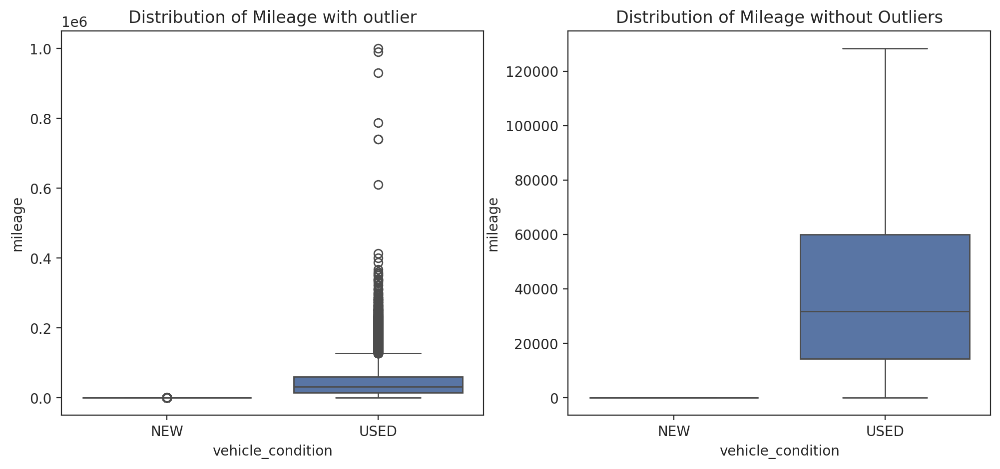

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Boxplot with outliers
sns.boxplot(data=at, y='mileage', x='vehicle_condition', ax=ax[0]).set(title='Distribution of Mileage with outlier')

# Boxplot without outliers
sns.boxplot(data=at, y='mileage', x='vehicle_condition', showfliers=False, ax=ax[1]).set(
    title='Distribution of Mileage without Outliers')

<Axes: xlabel='mileage', ylabel='Density'>

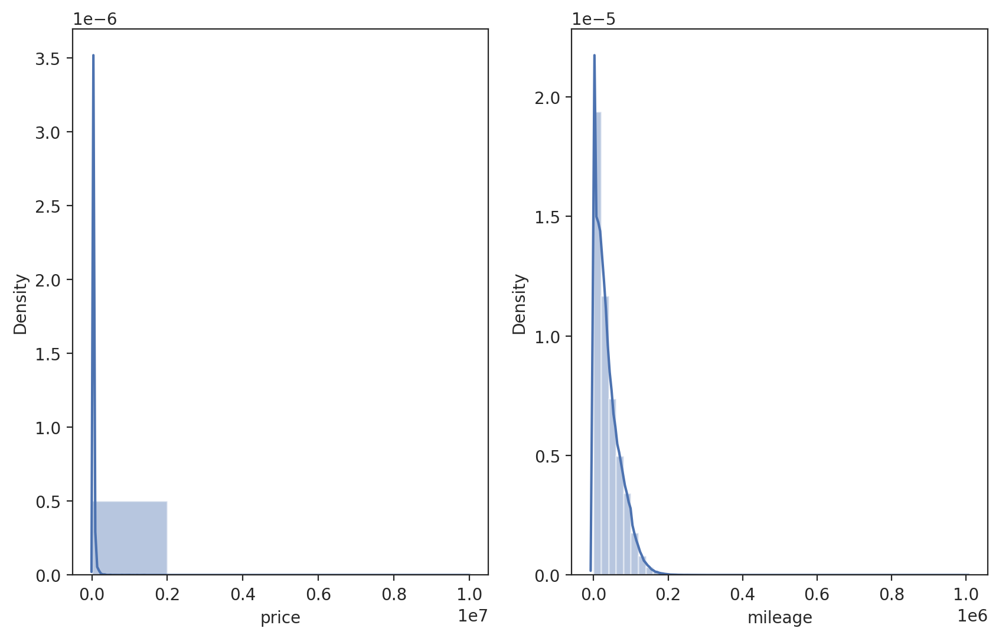

In [ ]:
# Distribution plot of mileage and price features
plt.figure(figsize=[10,6])
plt.subplot(121)
sns.distplot(at['price'], bins=5)
plt.subplot(122)
sns.distplot(at['mileage'])

In [ ]:
# count missing values(NANs) in each column of dataset
at.isna().sum()

mileage                    127
reg_code                 31857
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration     33311
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
dtype: int64

In [ ]:
# total percentage of missing data

percent_missing = (1 - (len(at.dropna()) / len(at))) * 100
percent_missing

9.59714431412545

9.60% of the dataset is missing

In [ ]:
# number of missing values, and percentage to each variable

def missing_vals(df):return pd.DataFrame({"no_of_missing_vals": df.isna().sum(),"%_of_missing_vals": round((df.isna().sum() / len(df)) * 100, 2), })

missing_vals(at)

,no_of_missing_vals,%_of_missing_vals
mileage,127,0.03
reg_code,31857,7.92
standard_colour,5378,1.34
standard_make,0,0.00
standard_model,0,0.00
vehicle_condition,0,0.00
year_of_registration,33311,8.29
price,0,0.00
body_type,837,0.21
crossover_car_and_van,0,0.00


In [ ]:
# check for total count of duplicate values
total_duplicates = at.duplicated().sum()
total_duplicates

8627

In [ ]:
# droping Duplicate values
at = at.drop_duplicates()

In [ ]:
at.shape

(393378, 11)

In [ ]:
# Calculate the total number of missing values in 'year_of_registration' for each 'reg_code'
missing_values_by_reg_code = at[at['year_of_registration'].isna()].groupby('reg_code').size()

# Sum the missing values across all 'reg_code' to find the total
total_missing_values = missing_values_by_reg_code.sum()

print(f'Total missing values in year_of_registration related to reg_code are {total_missing_values}')

Total missing values in year_of_registration related to reg_code are 1722


In [ ]:
# Finding missing values in year_of_registration grouped with vechile_condition by NEW CARs
at.groupby('vehicle_condition')['year_of_registration'].get_group('NEW').isna().sum()

24487

In [ ]:
# Finding missing values in year_of_registration grouped with vechile_condition by USED CARs
at.groupby('vehicle_condition')['year_of_registration'].get_group('USED').isna().sum()

2040

In [ ]:
# finding values between 1900 to 2020
#(at['year_of_registration'].between(1900,2020)).sum() / at.shape[0]

In [ ]:
# converting datatype of registration year into integer
#at['year_of_registration'] = at['year_of_registration'].astype('int64')

In [ ]:
at = at[(at['year_of_registration'] > 1900)]

In [ ]:
at.isna().sum()

mileage                   106
reg_code                  287
standard_colour          4224
standard_make               0
standard_model              0
vehicle_condition           0
year_of_registration        0
price                       0
body_type                 486
crossover_car_and_van       0
fuel_type                 302
dtype: int64

In [ ]:
at['mileage'].fillna(at['mileage'].median().round(1), inplace=True)
# Fill missing values in the 'reg_code' column with the word 'Unknown'
at['reg_code'].fillna('Unknown', inplace=True)
at['standard_colour'].fillna(at['standard_colour'].mode()[0], inplace=True)
at['body_type'].fillna(at['body_type'].mode()[0], inplace=True)
at['fuel_type'].fillna(at['fuel_type'].mode()[0], inplace=True)
at['year_of_registration'].fillna(at['year_of_registration'].median(), inplace=True)

In [ ]:
at.isna().sum()

mileage                  0
reg_code                 0
standard_colour          0
standard_make            0
standard_model           0
vehicle_condition        0
year_of_registration     0
price                    0
body_type                0
crossover_car_and_van    0
fuel_type                0
dtype: int64

In [ ]:
at = at.drop(['reg_code'], axis =1)

In [ ]:
# displaying datatypes of each variables
at.dtypes

mileage                  float64
standard_colour           object
standard_make             object
standard_model            object
vehicle_condition         object
year_of_registration     float64
price                      int64
body_type                 object
crossover_car_and_van       bool
fuel_type                 object
dtype: object

#Check for outliers


In [ ]:
# to check for the top 20 minimum "price" values
top_20_min_prices = at["price"].value_counts().sort_index().head(20)
top_20_min_prices

120     1
122     1
150     1
180     1
200     3
225     1
240     1
250    10
258     1
279     1
290     2
295     7
298     1
299     1
300    15
310     1
325     2
345     1
350    22
354     1
Name: price, dtype: int64

In this instance, the minimum price is 120.

In [ ]:
# to check for the top 20 maximum "price" values
top_20_max_prices = at["price"].value_counts().sort_index(ascending=False).head(20)
top_20_max_prices

3799995    1
2850000    1
2500000    1
2299950    1
2195000    1
2150000    2
2049950    1
1950000    1
1699995    1
1590000    1
1400000    1
1395000    1
1350000    2
1295000    1
1200000    3
1100000    1
1099950    1
1050000    1
1000000    1
999999     3
Name: price, dtype: int64

The top 20 high prices for the column are shown here, and as we can see, there is a significant difference between the highest price, which is 9,999,999, and the others. Thus, we must eliminate the outliers.

In [ ]:
# to check for the top twenty "mileage" minimum values
top_20_min_mileages = at["mileage"].value_counts().sort_index().head(20)
top_20_min_mileages

0.0      330
1.0      110
2.0       25
3.0       26
4.0       54
5.0      548
6.0      105
7.0       90
8.0      171
9.0       72
10.0    2002
11.0     133
12.0     127
13.0      56
14.0      72
15.0     246
16.0      37
17.0      33
18.0      29
19.0      28
Name: mileage, dtype: int64

In [ ]:
# to check for the top 20 maximum "mileage" values
top_20_max_mileages = at["mileage"].value_counts().sort_index(ascending=False).head(20)
top_20_max_mileages

999999.0    1
990000.0    1
930000.0    1
788072.0    1
740000.0    2
611121.0    1
413079.0    1
400321.0    1
388000.0    1
368199.0    1
360000.0    1
356744.0    1
355000.0    1
351000.0    1
350000.0    1
340000.0    1
339654.0    1
339000.0    1
336793.0    1
336472.0    1
Name: mileage, dtype: int64

#Dealing with outliers

In [ ]:
# Sorting the 'price' column values in ascending order
sorted_prices = sorted(at['price'])

# Calculating the 10th and 90th percentiles of the sorted prices
percentiles_10_90 = np.percentile(sorted_prices, [10, 90])

# Assigning the 10th and 90th percentiles of price to variables q1 and q2
q1, q2 = percentiles_10_90
q1, q2

(3795.0, 28495.0)

In [ ]:
# fixing the range of price between the percentile values 3995.0 and 31500
at = at[(at.price <=28495.0) & (at.price >=3795.0)]
at.shape

(294105, 10)

In [ ]:
# Sorting the 'mileage' column values in ascending order
sorted_mileage = sorted(at['mileage'])

# Calculating the 10th and 90th percentiles of the sorted mileage
percentiles_10_90 = np.percentile(sorted_mileage, [10, 90])

# Assigning the 10th and 90th percentiles of mileage to variables q1 and q2
q1, q2 = percentiles_10_90
q1, q2

(6613.4000000000015, 80707.60000000021)

In [ ]:
# fixing the range of mileage between the percentile values 3290.0 and 78000
at = at[(at.mileage <=80707.6) & (at.mileage >=6613.4)]
at.shape

(235283, 10)

In [ ]:
#at = at[(at['mileage'] < 300000) & (at['mileage'] > 500)]

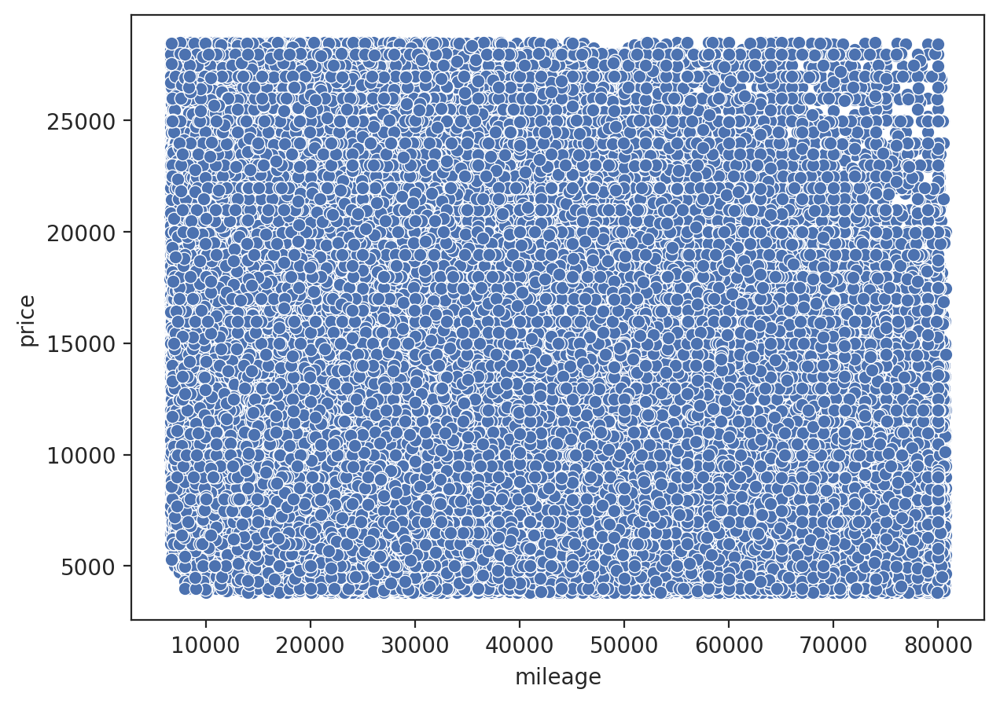

In [ ]:
# Visualizing the scatter plot of mileage and price
plt.figure(figsize=[7,5])
ax = sns.scatterplot(x = at['mileage'], y=at['price'])
ax.get_xaxis().get_major_formatter().set_scientific(False)
ax.get_yaxis().get_major_formatter().set_scientific(False)

#Feature Engineering

In [ ]:
# Convert year and mileage to integer.
at['year_of_registration'] = at['year_of_registration'].astype('int64')
at['mileage'] = at['mileage'].astype('int64')

In [ ]:
# transform crossover_car_and_van values into False=0 and True=1
at['crossover_car_and_van'] = at['crossover_car_and_van'].apply(lambda x: 0 if x == False else 1)
# transform crossover_car_and_van values into False=0 and True=1
at['vehicle_condition'] = at['vehicle_condition'].apply(lambda x: 1 if x == 'NEW' else 0)

In [ ]:
# Finding unique/distinct years in the 'year_of_registration' column
distinct_years = at['year_of_registration'].dropna().unique()

# Optionally, you can sort the years if needed
distinct_years_sorted = np.sort(distinct_years)

# Displaying the sorted distinct years
print(distinct_years_sorted)

[1909 1933 1934 1952 1957 1960 1961 1962 1963 1964 1965 1966 1967 1968
 1969 1970 1971 1972 1973 1974 1975 1976 1977 1978 1979 1980 1981 1982
 1983 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993 1994 1995 1996
 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010
 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020]


In [ ]:
#create two features car age and avg miles
current_year = pd.Timestamp.now().year
at.loc[:, 'car_age'] = current_year - at['year_of_registration']
at.loc[:, 'car_age'] = np.maximum(at['car_age'], 1)
at.loc[:, 'avg_miles'] = at['mileage'] / at['car_age']

In [ ]:
at['avg_miles'].describe()

count    235283.000000
mean       4082.857314
std        1898.961567
min         125.000000
25%        2616.366667
50%        3818.181818
75%        5248.803571
max       20125.000000
Name: avg_miles, dtype: float64

In [ ]:
at['avg_miles'] = at['avg_miles'].astype('int64')

In [ ]:
at.head()

,mileage,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,car_age,avg_miles
public_reference,,,,,,,,,,,,
202007020778474,7800,Grey,SKODA,Yeti,0,2017,14000,SUV,0,Petrol,7,1114
202007080986776,45000,Brown,Vauxhall,Mokka,0,2016,7995,Hatchback,0,Diesel,8,5625
202007161321269,64000,Grey,Land Rover,Range Rover Sport,0,2015,26995,SUV,0,Diesel,9,7111
202007080998445,24075,Red,Vauxhall,Viva,0,2017,5861,Hatchback,0,Petrol,7,3439
202007151278313,77000,Grey,Volkswagen,Passat,0,2010,4499,Saloon,0,Diesel,14,5500


In [ ]:
at=at.drop(['year_of_registration'], axis =1)


In [ ]:
at.dtypes

mileage                   int64
standard_colour          object
standard_make            object
standard_model           object
vehicle_condition         int64
price                     int64
body_type                object
crossover_car_and_van     int64
fuel_type                object
car_age                   int64
avg_miles                 int64
dtype: object

In [ ]:
#Let's create a object corr_matrix as the result of passing the at to the .corr() method.
corr_matrix = at.phik_matrix()

interval columns not set, guessing: ['mileage', 'vehicle_condition', 'price', 'crossover_car_and_van', 'car_age', 'avg_miles']


<Axes: >

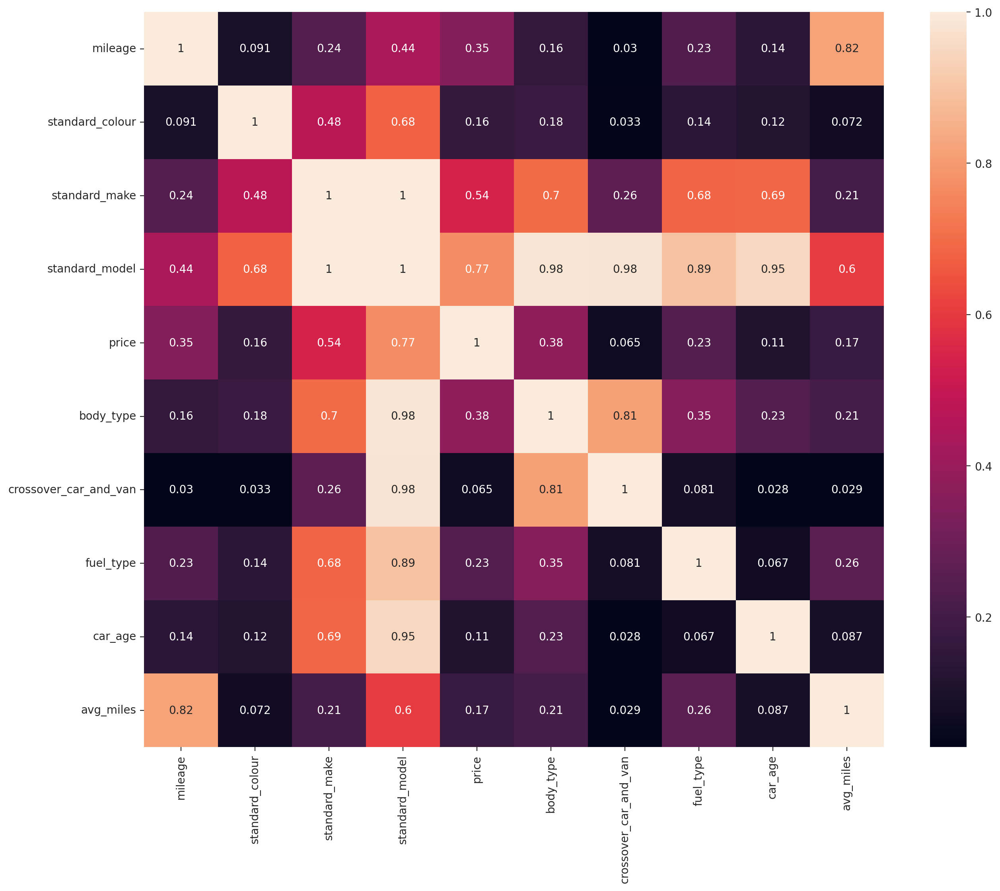

In [ ]:
plt.figure(figsize=(15,12))
sns.heatmap(corr_matrix, annot=True)

In [ ]:
# Slicing the dataset to display the correlated columns with "price" with greater values on the top.
corr_matrix["price"].sort_values(ascending=False)

price                    1.000000
standard_model           0.769327
standard_make            0.541956
body_type                0.378235
mileage                  0.351464
fuel_type                0.233478
avg_miles                0.173399
standard_colour          0.164367
car_age                  0.113981
crossover_car_and_van    0.065285
Name: price, dtype: float64

In [ ]:
#sample of the dataset
seed = 2024
sat = at.sample(frac=0.2,random_state=seed)
sat.shape

(47057, 11)

In [ ]:
sat.head()

,mileage,standard_colour,standard_make,standard_model,vehicle_condition,price,body_type,crossover_car_and_van,fuel_type,car_age,avg_miles
public_reference,,,,,,,,,,,
202009244158511,6792,Red,Toyota,AYGO,0,6695,Hatchback,0,Petrol,7,970
202009173832661,10789,Red,Hyundai,i10,0,7700,Hatchback,0,Petrol,6,1798
202010155023159,12734,Blue,BMW,X1,0,23950,SUV,0,Petrol,8,1591
202009254186656,75600,Grey,Volkswagen,Polo,0,4500,Hatchback,0,Diesel,13,5815
202009153769817,12098,Black,Audi,A5,0,20999,Hatchback,0,Petrol,6,2016


In [ ]:
# indicate target colums
y=sat["price"]
# indicate columns that will serve as features
X=sat.drop(columns=["price", "crossover_car_and_van"])

In [ ]:
# passing features and labels to train_test_split to create X_train, X_test, y_train, y_test ate the rate 80%/20%
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
#Target encoding standard_make and standard_model columns of the training and test datasets
encoder = TargetEncoder(cols=['standard_make','standard_model']).fit(X_train, y_train)
X_train = encoder.transform(X_train)
X_test = encoder.transform(X_test)

In [ ]:
print("X train=", X_train.shape, "y_train=", y_train.shape)
print("X_test=", X_test.shape, "y_test=", y_test.shape)

X train= (37645, 9) y_train= (37645,)
X_test= (9412, 9) y_test= (9412,)


In [ ]:
# Define the numerical feature transformation pipeline
num_feat = ['mileage','car_age','avg_miles']
num_transformer = Pipeline(steps=[
    ('poly',PolynomialFeatures(interaction_only=True, include_bias=False)),
    ('scaler', StandardScaler())
]).set_output(transform='pandas')


cat_feat = ['standard_colour','body_type','fuel_type']
categorical_transformer = Pipeline(steps=[
        ("target_encoder", TargetEncoder(cols=cat_feat))
    ])

    # Categorical transformer using Target Encoding

    # Combine numeric and categorical transformers


preprocessor = ColumnTransformer(
    transformers=
    [
        ('num_feat', num_transformer, num_feat),
        ('cat_feat', categorical_transformer, cat_feat)
    ],
    remainder='passthrough',
    verbose_feature_names_out=False
).set_output(transform="pandas")

# Apply the preprocessor on the test set
preprocessor.fit(X_train, y_train)
X_train = preprocessor.transform(X_train)
X_test = preprocessor.transform(X_test)

In [ ]:
preprocessor

ColumnTransformer(remainder='passthrough',
                  transformers=[('num_feat',
                                 Pipeline(steps=[('poly',
                                                  PolynomialFeatures(include_bias=False,
                                                                     interaction_only=True)),
                                                 ('scaler', StandardScaler())]),
                                 ['mileage', 'car_age', 'avg_miles']),
                                ('cat_feat',
                                 Pipeline(steps=[('target_encoder',
                                                  TargetEncoder(cols=['standard_colour',
                                                                      'body_type',
                                                                      'fuel_type']))]),
                                 ['standard_colour', 'body_type',
                                  'fuel_type'])],
                  verbose_feature_names_out=False)

#Feature Selection and Dimensionality Reduction

Automated Feature Selection

In [ ]:
#Applying automated feature selection using Kbest
selector = SelectKBest(f_regression, k=10)
selector.fit(X_train, y_train)

X_train_kbest = selector.transform(X_train)
X_test_kbest = selector.transform(X_test)

In [ ]:
X_train_kbest

array([[-6.14843385e-01, -7.71842181e-01, -6.86031721e-01, ...,
         1.13247018e+04,  1.56279342e+04,  1.74789923e+04],
       [-3.84546088e-01, -1.02511054e-01, -3.83295117e-01, ...,
         1.41451195e+04,  1.07887142e+04,  9.57117503e+03],
       [-7.45756278e-01, -4.37176617e-01, -6.68124921e-01, ...,
         1.13247018e+04,  1.17127669e+04,  1.11885769e+04],
       ...,
       [ 2.23164772e+00,  2.32154510e-01,  1.42799757e+00, ...,
         1.41451195e+04,  1.72224640e+04,  1.77575005e+04],
       [-1.14633838e+00, -4.37176617e-01, -8.71781978e-01, ...,
         1.13247018e+04,  1.17127669e+04,  1.11885769e+04],
       [ 1.26783573e+00, -4.37176617e-01,  3.55590871e-01, ...,
         1.41451195e+04,  1.56279342e+04,  1.65148048e+04]])

In [ ]:
# Assuming 'original_df' is the original DataFrame from which X_train was derived

# Get the indices of the top 10 features selected by SelectKBest
top_10_indices = selector.scores_.argsort()[-10:][::-1]

# Use these indices to extract the feature names from the original DataFrame
top_10_feature_names = X_train.columns[top_10_indices]

# Print the names of the top 10 features
print("Top 10 Features Selected by SelectKBest:")
for feature_name in top_10_feature_names:
    print(feature_name)


Top 10 Features Selected by SelectKBest:
standard_model
standard_make
body_type
car_age
mileage car_age
mileage
car_age avg_miles
fuel_type
mileage avg_miles
standard_colour


In [ ]:

# Get indices of the top 10 features selected by SelectKBest
top_10_indices = selector.scores_.argsort()[-10:][::-1]

# Extract the names of these top 10 features
top_10_feature_names = X_train.columns[top_10_indices]

# Print the names of the top 10 features
print("Top 10 Features Selected by SelectKBest:")
for feature in top_10_feature_names:
    print(feature)




Top 10 Features Selected by SelectKBest:
standard_model
standard_make
body_type
car_age
mileage car_age
mileage
car_age avg_miles
fuel_type
mileage avg_miles
standard_colour


In [ ]:
print("Features Selected by SelectKBest: ", selector.get_feature_names_out())

Features Selected by SelectKBest:  ['mileage' 'car_age' 'mileage car_age' 'mileage avg_miles'
 'car_age avg_miles' 'standard_colour' 'body_type' 'fuel_type'
 'standard_make' 'standard_model']


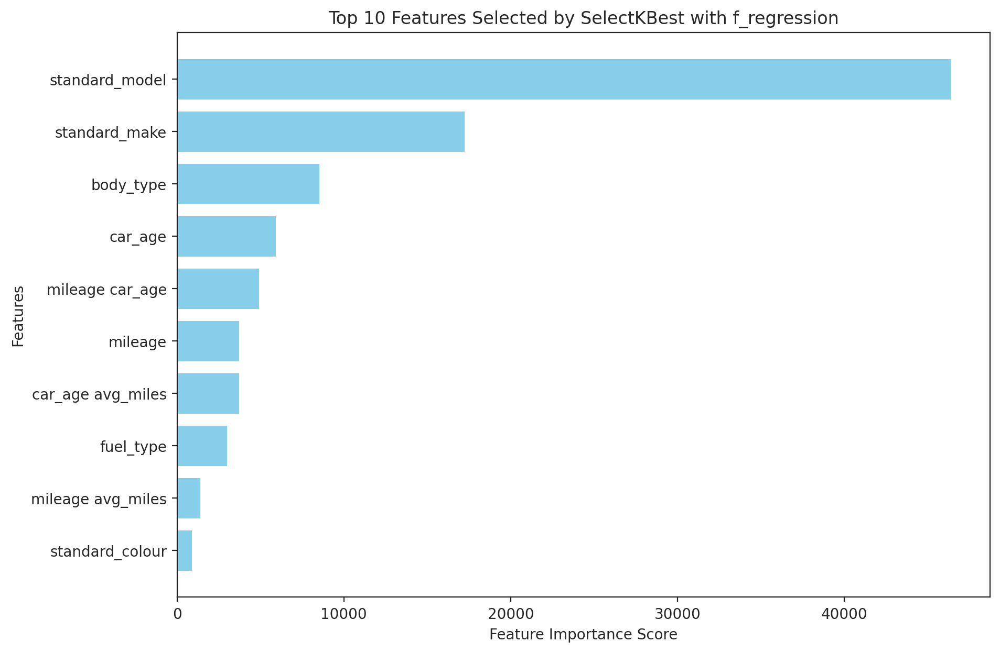

In [ ]:

# Assuming 'selector' is already fitted as shown previously
scores = selector.scores_

# Sort the scores and select top 10
top_indices = scores.argsort()[-10:][::-1]  # Indices of top features
top_scores = scores[top_indices]            # Scores of top features
top_feature_names = X_train.columns[top_indices]  # Names of top features

# Plot
plt.figure(figsize=(10, 7))
plt.barh(y=top_feature_names, width=top_scores, color='skyblue')
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title('Top 10 Features Selected by SelectKBest with f_regression')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest score at the top
plt.show()


#Dimensionality Reduction

In [ ]:
#Dimensionality reduction using PCA
pca_full = PCA()
pca_full.fit(X_train)

PCA()

In [ ]:
pca_full.explained_variance_ratio_

array([7.20308614e-01, 1.37806781e-01, 6.77564890e-02, 5.29339707e-02,
       2.11939911e-02, 1.19714474e-07, 3.06418635e-08, 1.75878989e-09,
       1.07697946e-09, 5.70247252e-10, 2.59982778e-16, 0.00000000e+00])

Number of PCA components: 4


Text(0, 0.5, 'Cummulative Explained Variance')

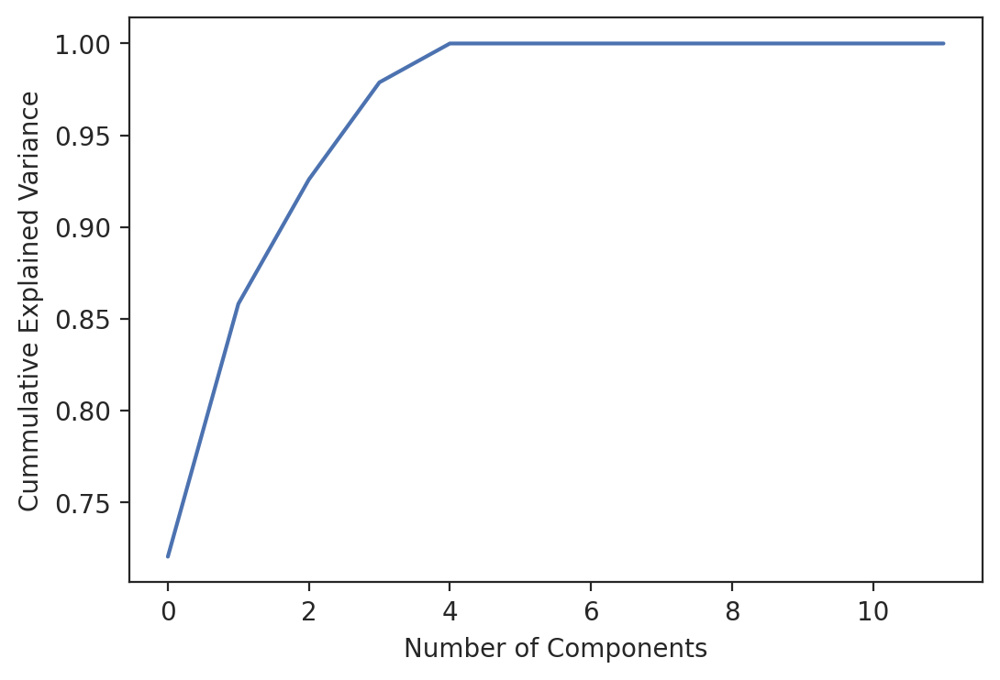

In [ ]:
pca_evr=np.cumsum(pca_full.explained_variance_ratio_)
num=np.argmax(pca_evr >=0.95)+1
print("Number of PCA components:", num)
plt.plot(np.cumsum(pca_full.explained_variance_ratio_))
plt.xlabel("Number of Components")
plt.ylabel("Cummulative Explained Variance")

In [ ]:
pca = PCA(n_components= 4)
pca.fit(X_train, y_train)
X_train_pca= pca.transform(X_train)
X_test_pca= pca.transform(X_test)

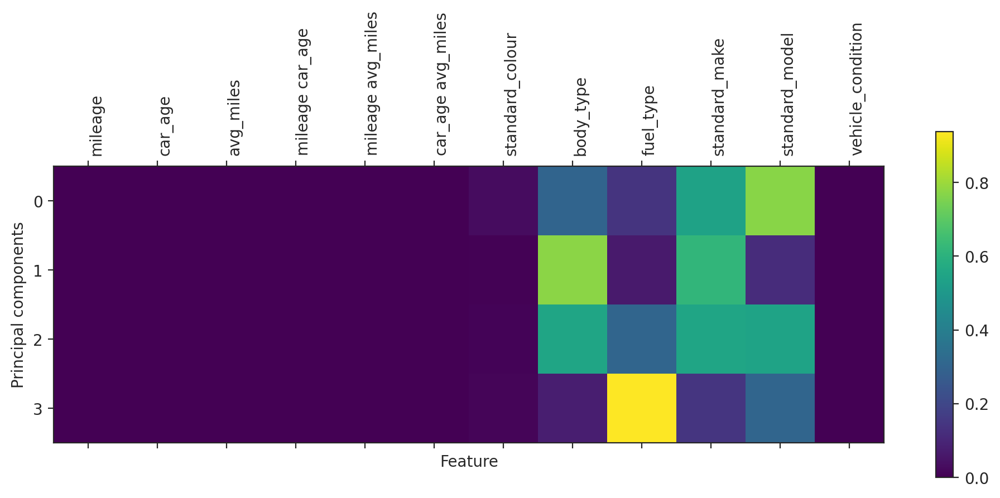

In [ ]:
plt.matshow(np.abs(pca.components_), cmap='viridis')
plt.colorbar()
plt.xticks(range(len(X_train.columns)),
           X_train.columns,rotation=90, ha='left')
plt.xlabel("Feature")
plt.ylabel("Principal components");

In [ ]:
cvr = np.cumsum(pca.explained_variance_ratio_)
evr = pca.explained_variance_ratio_

pca_df = pd.DataFrame()
pca_df['Cumulative Variance Ratio'] = cvr
pca_df['Explained Variance Ratio'] = evr
display(pca_df.head())

,Cumulative Variance Ratio,Explained Variance Ratio
0,0.720309,0.720309
1,0.858115,0.137807
2,0.925872,0.067756
3,0.978806,0.052934


# Model Building

In [ ]:
!pip install xgboost

In [ ]:
from xgboost import XGBRegressor

In [ ]:
lr   = LinearRegression()
rfr  = RandomForestRegressor()
xgbr = XGBRegressor()
my_models = [ lr, rfr, xgbr ]

In [ ]:
#apply the Linear Regression on the train and test set
lr.fit(X_train_kbest, y_train)
lr_pred = lr.predict(X_test_kbest)
lr.score(X_test_kbest, y_test)

0.7448307339560017

In [ ]:
from sklearn.metrics import mean_squared_error
import numpy as np

# Assuming y_test are the true target values and lr_pred are the predictions from your model
rmse = np.sqrt(mean_squared_error(y_test, lr_pred))
print(f"RMSE: {rmse}")


RMSE: 2868.681121878396


In [ ]:
#Fit the Linear Regression on the train and test set
rfr.fit(X_train_kbest, y_train)
rfr_pred = rfr.predict(X_test_kbest)
rfr.score(X_test_kbest, y_test)

0.8547521652204655

In [ ]:
# Calculating RMSE with root_mean_squared_error

rmse = np.sqrt(mean_squared_error(y_test, rfr_pred))
print(f"RMSE: {rmse}")


RMSE: 2164.327246334325


In [ ]:
#Fit the GradientBoostingRegressor Regressor on the train and test set
xgbr.fit(X_train_kbest, y_train)
xgbr_pred = xgbr.predict(X_test_kbest)
xgbr.score(X_test_kbest, y_test)

0.8737995971909791

In [ ]:
# Calculating RMSE with root_mean_squared_error
rmse = np.sqrt(mean_squared_error(y_test, xgbr_pred))
print(f"RMSE: {rmse}")

RMSE: 2017.429949302726


In [ ]:
# Define the hyperparameter grid
rfr = RandomForestRegressor()

param_grid = {
    "max_depth": [2, 10, 20],
    "n_estimators": [20, 100],
    "max_features": [10, 50]
}

# Create the GridSearchCV object
rfr_grid = GridSearchCV(rfr, param_grid, cv=5, n_jobs=-1, verbose=1, scoring="neg_mean_squared_error")

# Fit the GridSearchCV object to the training data
rfr_grid.fit(X_train_kbest, y_train)

# Print the best hyperparameters and score
print(f"Best parameters: {rfr_grid.best_params_}")
print(f"Best score: {np.sqrt(-rfr_grid.best_score_)}")

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters: {'max_depth': 20, 'max_features': 50, 'n_estimators': 100}
Best score: 2138.801005232401


In [ ]:
# Train the model on the entire training set using the best hyperparameters
rfr_best = rfr_grid.best_estimator_
rfr_best.fit(X_train_kbest, y_train)

# Evaluate the model on the test set
rfr_y_pred = rfr_best.predict(X_test_kbest)

# Evaluate the performance of the model on the test set using mean squared error and R-squared
mse = mean_squared_error(y_test, rfr_y_pred)
r2 = r2_score(y_test, rfr_y_pred)
print("Mean squared error:", mse)
print("R-squared:", r2)
print("Root Mean squared error:", np.sqrt(mse))

Mean squared error: 4592080.527869377
R-squared: 0.8576120265495139
Root Mean squared error: 2142.9140271764


In [ ]:
#Cross validation for RandomForest Regressor
rfr_scores = cross_val_score(rfr_best, X_train_kbest, y_train, cv=10, scoring='neg_root_mean_squared_error')
rfr_scores.mean()*-1, rfr_scores.std()

(2122.6307417859593, 45.64414967494626)

In [ ]:

# Define the hyperparameter grid for XGBRegressor
xgbr = XGBRegressor()

param_grid_xgb = {
    "max_depth": [3, 6, 9],  # Typical values range between 3-10
    "n_estimators": [50, 100, 200],  # Number of trees. More might lead to overfitting.
    "learning_rate": [0.01, 0.1, 0.2],  # Step size shrinkage used to prevent overfitting. Range is [0,1]
    "subsample": [0.7, 0.8, 0.9],  # Subsample ratio of the training instances.
    "colsample_bytree": [0.7, 0.8, 0.9]  # Subsample ratio of columns when constructing each tree.
}

# Create the GridSearchCV object for XGBRegressor
xgbr_grid = GridSearchCV(xgbr, param_grid_xgb, cv=5, n_jobs=-1, verbose=1, scoring="neg_mean_squared_error")

# Assuming X_train_kbest and y_train are already defined and preprocessed
# Fit the GridSearchCV object to the training data
xgbr_grid.fit(X_train_kbest, y_train)

# Print the best hyperparameters and score (RMSE)
print(f"Best parameters: {xgbr_grid.best_params_}")
print(f"Best score (RMSE): {np.sqrt(-xgbr_grid.best_score_)}")


Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Best parameters: {'colsample_bytree': 0.9, 'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 200, 'subsample': 0.9}
Best score (RMSE): 1986.3819542315844


In [ ]:
# Train the model on the entire training set using the best hyperparameters
xgbr_best = xgbr_grid.best_estimator_
xgbr_best.fit(X_train_kbest, y_train)

# Evaluate the model on the test set
xgbr_y_pred = xgbr_best.predict(X_test_kbest)

# Evaluate the performance of the model on the test set using mean squared error and R-squared
mse = mean_squared_error(y_test, xgbr_y_pred)
r2 = r2_score(y_test, xgbr_y_pred)
print("Mean squared error:", mse)
print("R-squared:", r2)
print("Root Mean squared error:", np.sqrt(mse))

Mean squared error: 3952974.4670576523
R-squared: 0.8774289736319133
Root Mean squared error: 1988.208859012969


In [ ]:
#Cross validation for GradientBossting Regressor
xgbr_scores = cross_val_score(xgbr_best, X_train_kbest, y_train, cv=3, scoring='neg_root_mean_squared_error')
xgbr_scores.mean()*-1, xgbr_scores.std()

(2010.170908652458, 22.771291617459482)

In [ ]:
# Initialize models
rfr = RandomForestRegressor(max_depth=20, max_features=50, n_estimators=100)
xgbr = XGBRegressor(colsample_bytree = 0.9, learning_rate = 0.2, max_depth = 6, n_estimators = 200, subsample = 0.9)


#  define the list of estimators
estimators = [('rfr', rfr), ('xgbr', xgbr)]

# Create the VotingRegressor
ensemble = VotingRegressor(estimators)

# Fit the VotingRegressor
ensemble.fit(X_train_kbest, y_train)

# Make predictions and evaluate the model
ensemble_pred = ensemble.predict(X_test_kbest)
ensemble.score(X_test_kbest, y_test)


0.874070358679114

In [ ]:
rmse = np.sqrt(mean_squared_error(y_test, ensemble_pred))
print(f"RMSE: {rmse}")

RMSE: 2015.2646010670003


#Overall Cross Validation

In [ ]:
# Define the list of models in the ensemble
models = [rfr, xgbr, lr, ensemble]

# Iterate over the models and print the cross-validation scores
for i, model in enumerate(models):
    # Fit the model on the training data (Note: It's more efficient to perform cross-validation without fitting)

    # Calculate the cross-validation scores
    scores = cross_val_score(model, X_train_kbest, y_train, cv=10, scoring='neg_root_mean_squared_error')
    mean_score = -1 * scores.mean()
    std_score = scores.std()

    # Print the scores
    model_name = "Ensemble" if i == len(models) - 1 else type(model).__name__
    print("{} RMSE: {:.2f} (+/- {:.2f})".format(model_name, mean_score, std_score))

RandomForestRegressor RMSE: 2123.57 (+/- 41.78)
XGBRegressor RMSE: 1971.03 (+/- 37.28)
LinearRegression RMSE: 2819.80 (+/- 60.44)
Ensemble RMSE: 1992.42 (+/- 38.53)


In [ ]:
# Define the list of models in the ensemble
rfr = RandomForestRegressor()
xgbr = XGBRegressor()
lr = LinearRegression()
# Assume 'ensemble' is your custom ensemble model or another model from sklearn

models = [rfr, xgbr, lr, ensemble]

# Iterate over the models and print the cross-validation scores
for i, model in enumerate(models):
    scores = cross_val_score(model, X_train_kbest, y_train, cv=10, scoring='neg_root_mean_squared_error')
    mean_score = -1 * scores.mean()  # Convert from negative RMSE to positive
    std_score = scores.std()

    # Determine the model name
     # Print the scores
    model_name = "Ensemble" if i == len(models) - 1 else type(model).__name__
    print(f"{model_name} RMSE: {mean_score:.2f} (+/- {std_score:.2f})")


RandomForestRegressor RMSE: 2134.99 (+/- 42.72)
XGBRegressor RMSE: 1998.73 (+/- 41.67)
LinearRegression RMSE: 2819.80 (+/- 60.44)
Ensemble RMSE: 1992.41 (+/- 37.43)


In [ ]:
xgbr.fit(X_train_kbest, y_train)
rfr.fit(X_train_kbest, y_train)
lr.fit(X_train_kbest, y_train)
ensemble.fit(X_train_kbest, y_train)

VotingRegressor(estimators=[('rfr',
                             RandomForestRegressor(max_depth=20,
                                                   max_features=10)),
                            ('xgbr',
                             XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=0.9, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=0.2, max_bin=None,
                                          max_cat_threshold=None,
                                          max_cat_to_onehot=None,
                                          max_delta_step=None, max_depth=6,
                                          max_leaves=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          multi_strategy=None, n_estimators=200,
                                          n_jobs=None, num_parallel_tree=None,
                                          random_state=None, ...))])

In [ ]:
# Selecting the first 20 samples of the test set
xt = X_test_kbest[:20]
yt = y_test.head(20).to_numpy()

# Making predictions
pred_xgbr = xgbr.predict(xt)
pred_rfr = rfr.predict(xt)
pred_lr = lr.predict(xt)
pred_ens = ensemble.predict(xt)

In [ ]:
# Calculate and print the MAE for each model
print("MAE for XGradient Boosting Regressor:", mean_absolute_error(yt, pred_xgbr))
print("MAE for Random Forest Regressor:", mean_absolute_error(yt, pred_rfr))
print("MAE for Linear Regression:", mean_absolute_error(yt, pred_lr))
print("MAE for Ensemble:", mean_absolute_error(yt, pred_ens))

MAE for XGradient Boosting Regressor: 1138.359423828125
MAE for Random Forest Regressor: 1367.8183333333332
MAE for Linear Regression: 1908.7472750548018
MAE for Ensemble: 1145.5615204564424


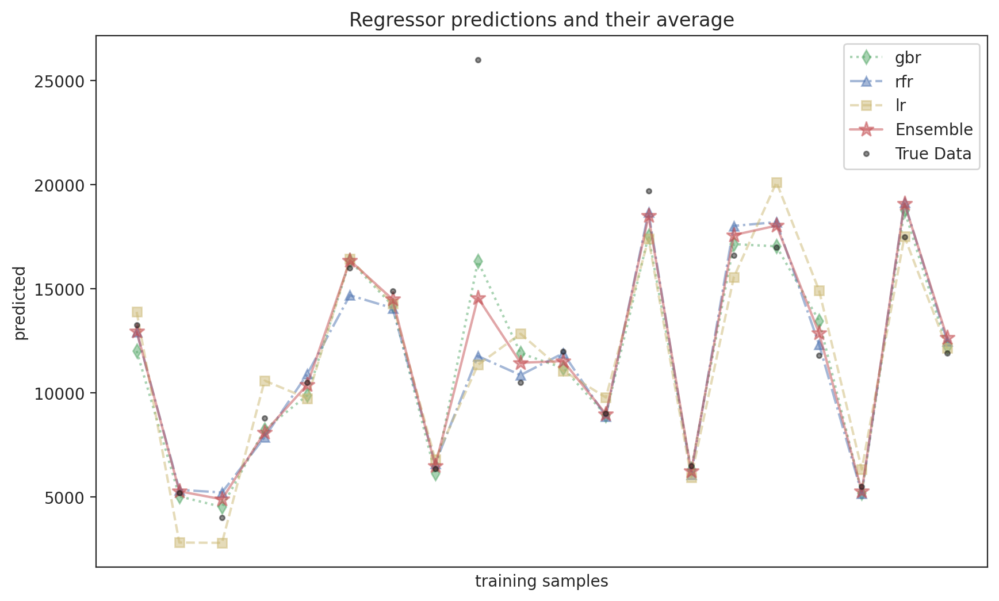

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

ax.plot(pred_xgbr, "gd:", alpha=0.5, label="gbr")
ax.plot(pred_rfr, "b^-.", alpha=0.5, label="rfr")
ax.plot(pred_lr, "ys--", alpha=0.5, label="lr")
ax.plot(pred_ens, "r*-", alpha=0.5, ms=10, label="Ensemble")
ax.plot(yt, "ko", alpha=0.5, ms=3, label="True Data")

ax.tick_params(axis="x", which="both", bottom=False, top=False, labelbottom=False)
ax.set_ylabel("predicted")
ax.set_xlabel("training samples")
ax.legend(loc="best")
ax.set_title("Regressor predictions and their average");

In [ ]:
y_pred = ensemble.predict(X_test_kbest)
mse = mean_squared_error(y_test, y_pred)
mae=mean_absolute_error(y_test,y_pred)
r2 = r2_score(y_test, y_pred)

print("Test MSE:", mse)
print("Test RMSE:", np.sqrt(mse))
print("Test R-squared:", r2)

Test MSE: 4064286.6555585526
Test RMSE: 2016.0076030507803
Test R-squared: 0.8739774843026669


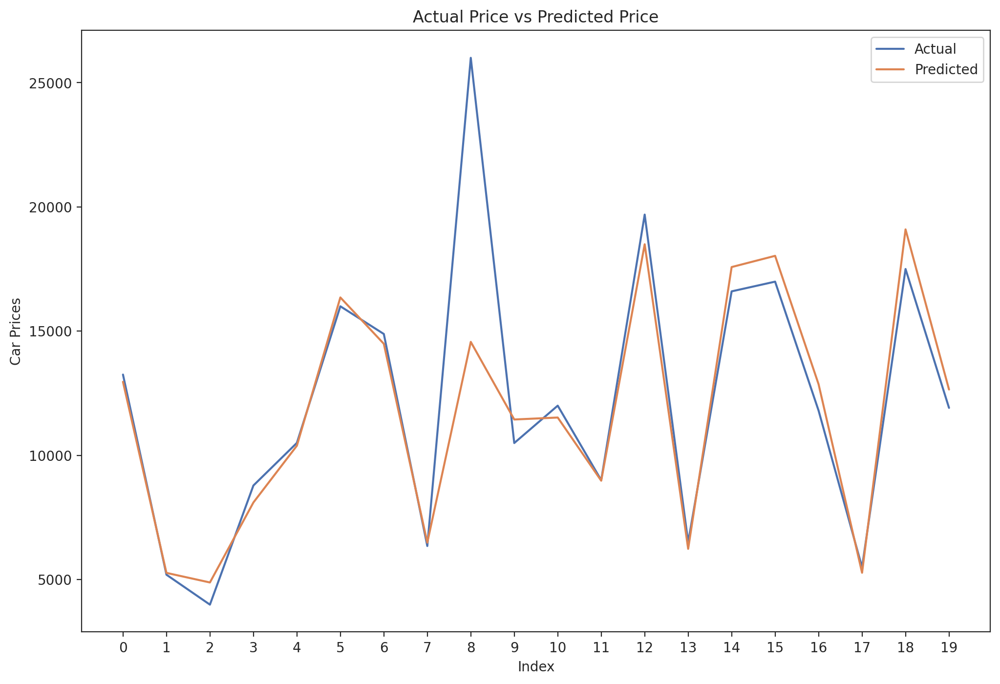

In [ ]:
# Plot the Actual vs Predicted Evaluation
ax = range(len(y_test[:20]))
plt.figure(figsize=(12,8))
plt.plot(ax, y_test[:20], label="Actual")
plt.plot(ax, y_pred[:20], label="Predicted")
plt.title("Actual Price vs Predicted Price")
plt.xlabel('Index')
plt.ylabel('Car Prices')
plt.xticks(np.arange(20))
plt.legend()
plt.show()

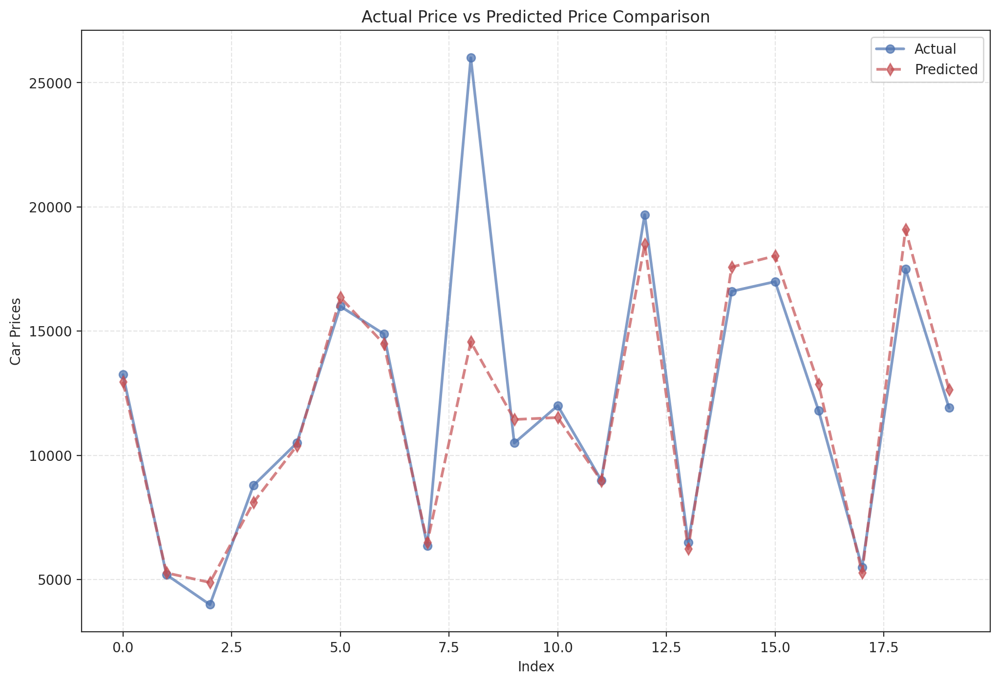

In [ ]:

# Generate a range object for the x-axis
x_range = range(len(y_test[:20]))

plt.figure(figsize=(12, 8))

# Plot actual vs predicted values with enhanced styling
plt.plot(x_range, y_test[:20], 'b-o', linewidth=2, markersize=6, label="Actual", alpha=0.7)
plt.plot(x_range, y_pred[:20], 'r--d', linewidth=2, markersize=6, label="Predicted", alpha=0.7)

# Add grid, labels, legend, and title
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlabel('Index')
plt.ylabel('Car Prices')
plt.legend()
plt.title('Actual Price vs Predicted Price Comparison')

# Show the plot
plt.show()

In [ ]:
explainer = shap.TreeExplainer(xgbr_best)

In [ ]:
X_eval = pd.DataFrame(X_test_kbest, columns=selector.get_feature_names_out())
shap_values = explainer(X_eval)

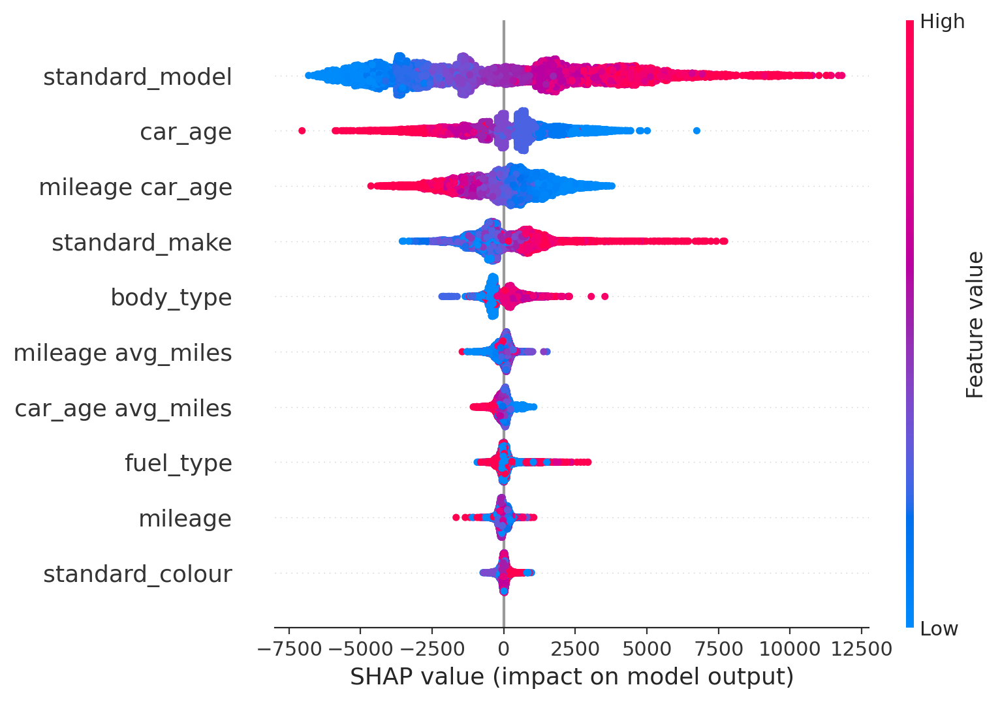

In [ ]:
shap.summary_plot(
    shap_values)

In [ ]:
explainers = shap.TreeExplainer(rfr_best)

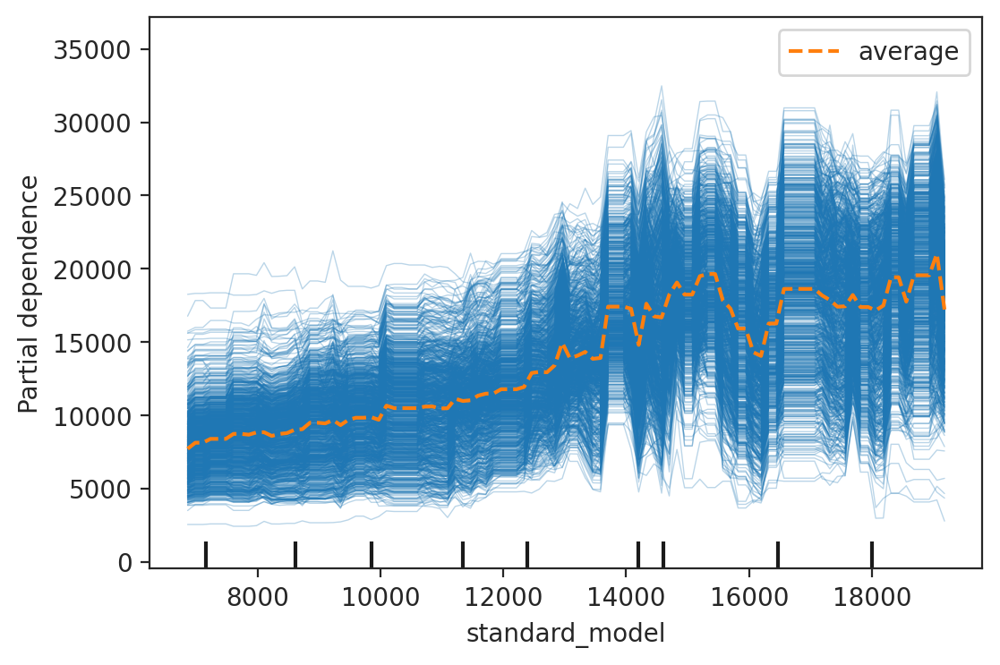

In [ ]:
# Create PDP plot for the 'temp' feature using PartialDependenceDisplay
PartialDependenceDisplay.from_estimator(
    xgbr_best,
    X_eval,
    features=['standard_model'],
    kind='both'
)


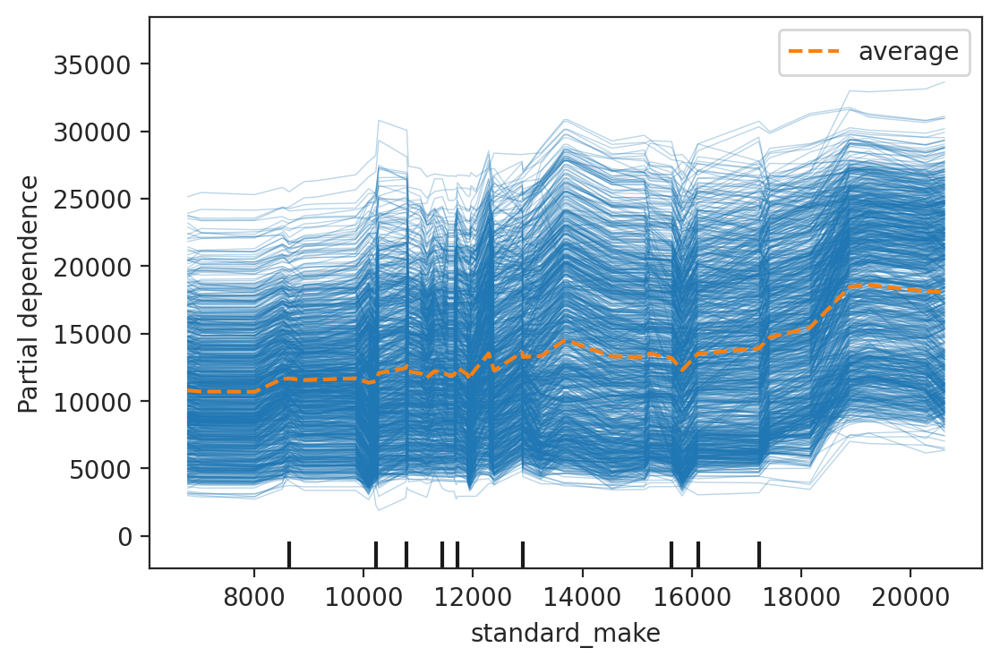

In [ ]:
# Create PDP plot for the 'temp' feature using PartialDependenceDisplay
PartialDependenceDisplay.from_estimator(
    xgbr_best,
    X_eval,
    features=['standard_make'],
    kind='both'
)

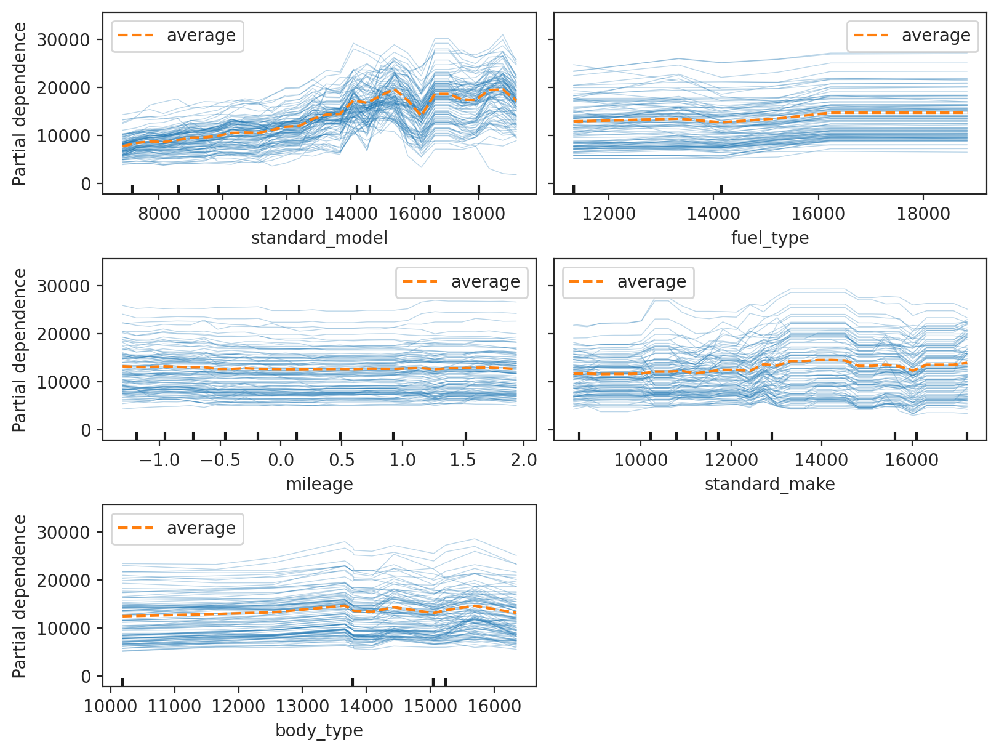

In [ ]:
top_features=["standard_model", "fuel_type", "mileage", "standard_make", "body_type"]
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    xgbr_best, X_eval, features=top_features,
    kind='both',
    subsample=100, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

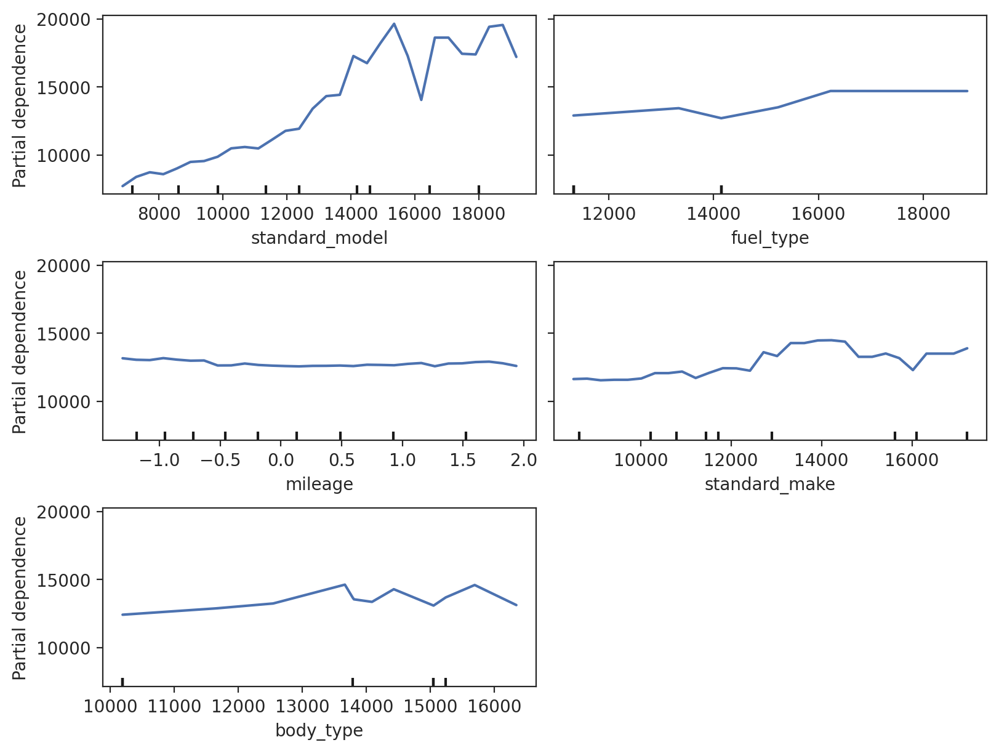

In [ ]:
top_features=["standard_model", "fuel_type", "mileage", "standard_make", "body_type"]
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    xgbr_best, X_eval, features=top_features,
    kind='average',
    subsample=100, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

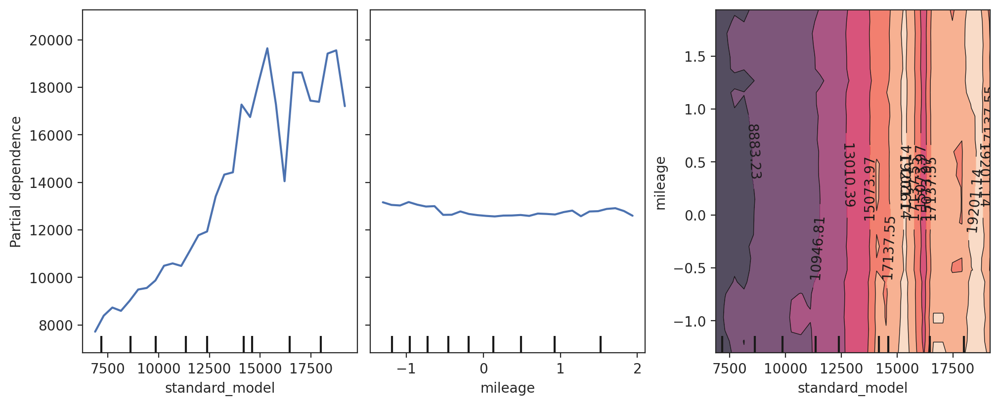

In [ ]:
fig, ax = plt.subplots(figsize=(10,4), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    xgbr_best, X_eval,
    features=["standard_model", "mileage", ("standard_model", "mileage")],
    kind='average',
    ax=ax, n_cols=3,
    subsample=50, grid_resolution=30, n_jobs=2, random_state=0,
);


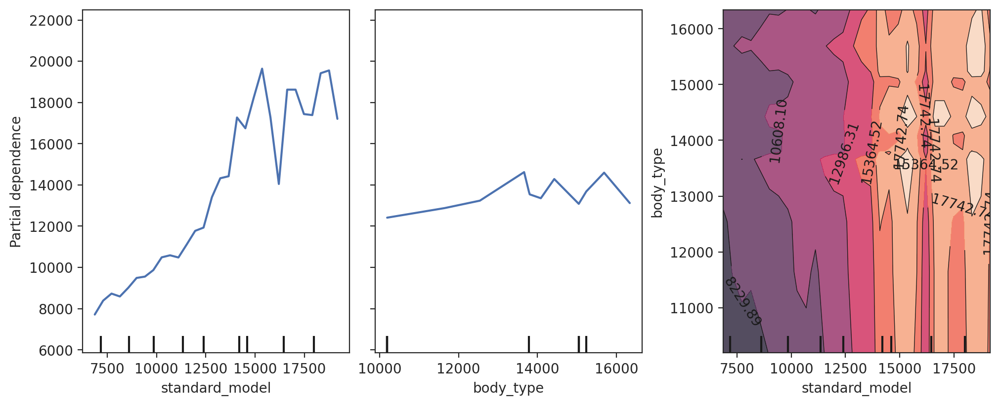

In [ ]:
fig, ax = plt.subplots(figsize=(10,4), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    xgbr_best, X_eval,
    features=["standard_model", "body_type", ("standard_model", "body_type")],
    kind='average',
    ax=ax, n_cols=3,
    subsample=50, grid_resolution=30, n_jobs=2, random_state=0,
);

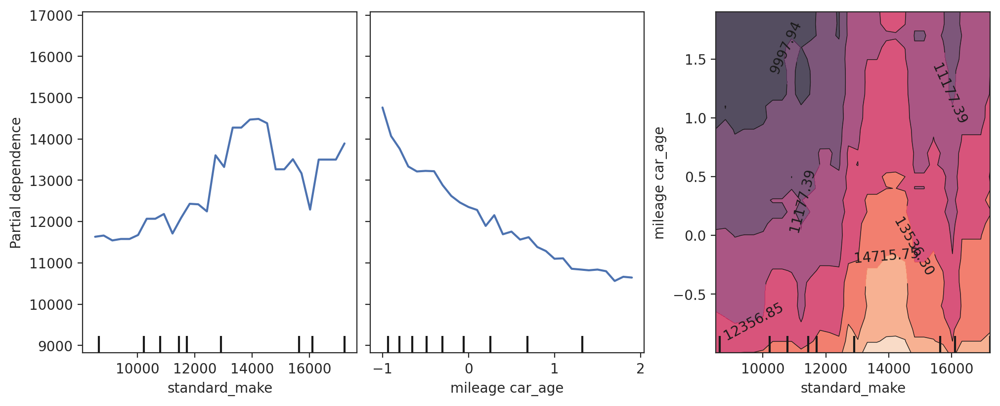

In [ ]:
fig, ax = plt.subplots(figsize=(10,4), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    xgbr_best, X_eval,
    features=["standard_make", "mileage car_age", ("standard_make", "mileage car_age")],
    kind='average',
    ax=ax, n_cols=3,
    subsample=50, grid_resolution=30, n_jobs=2, random_state=0,
);